# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Imports

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

%matplotlib inline   

## 1. Calibration
### Using a series of images of a chessboard in order to compute the camera calibration matrix and distortion coefficients.
* Finding Corners

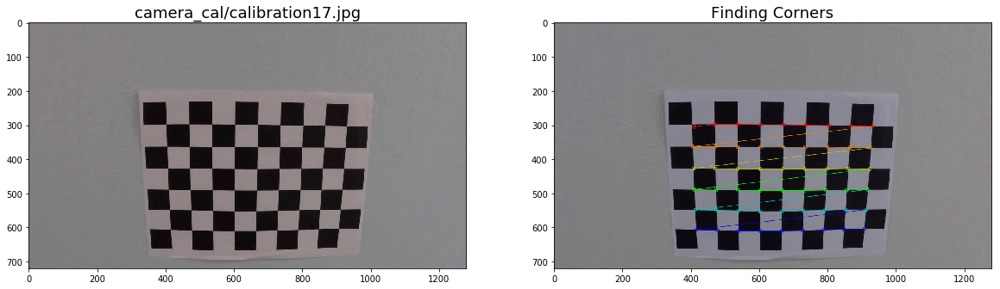

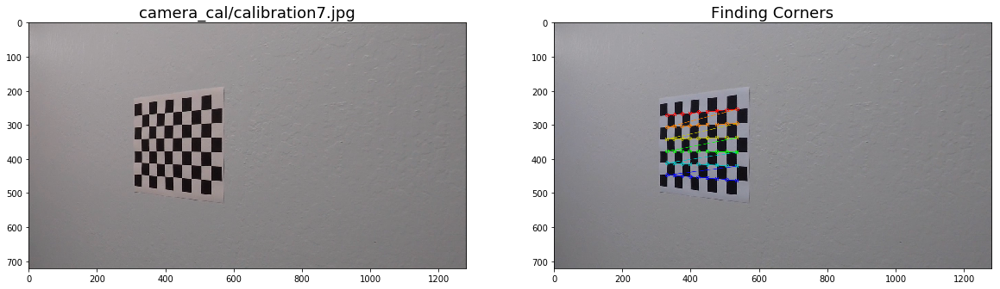

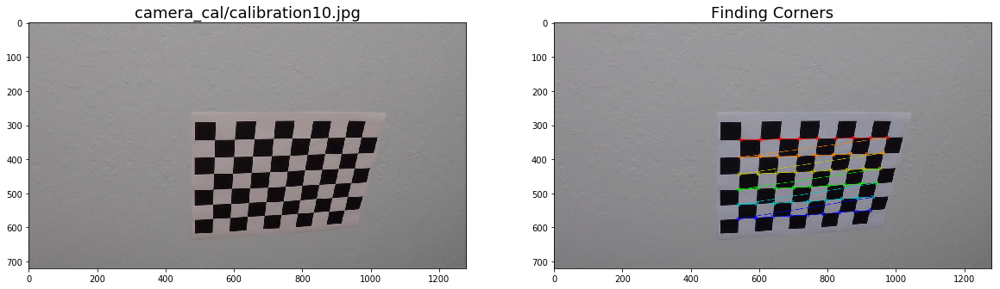

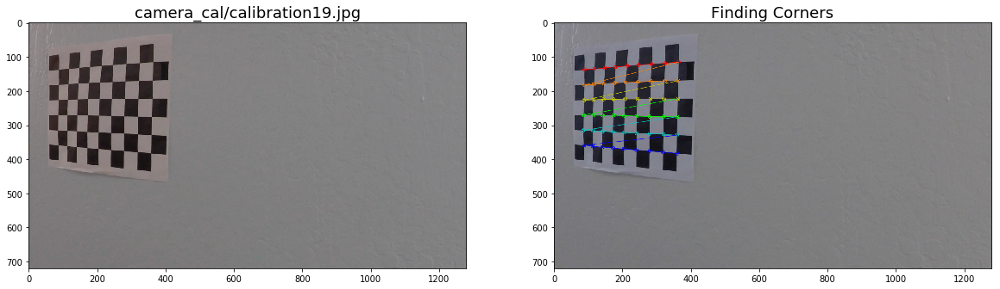

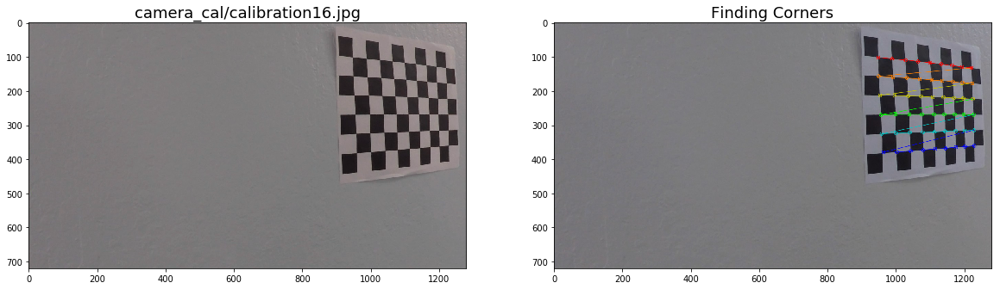

...

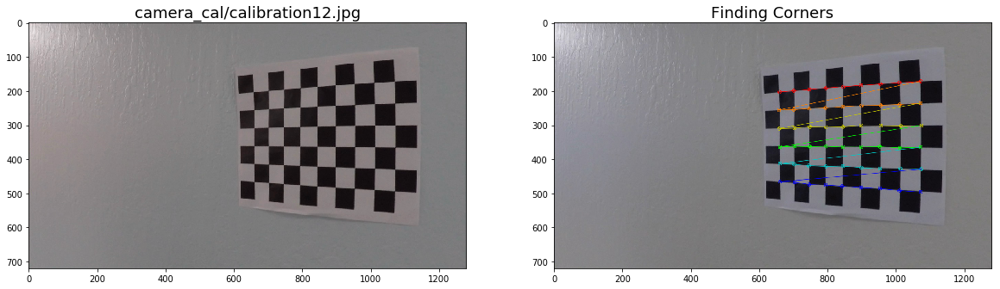

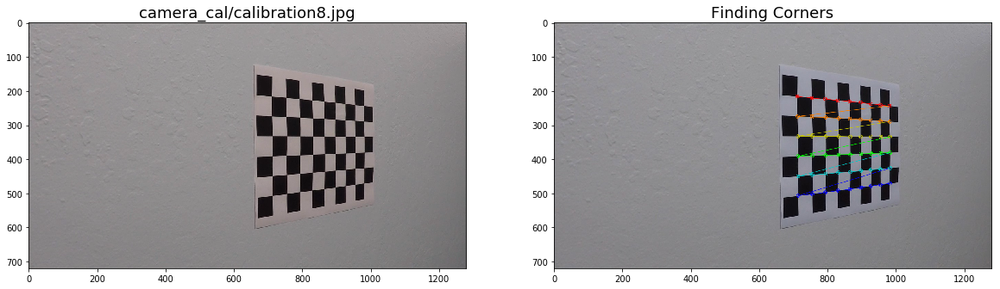

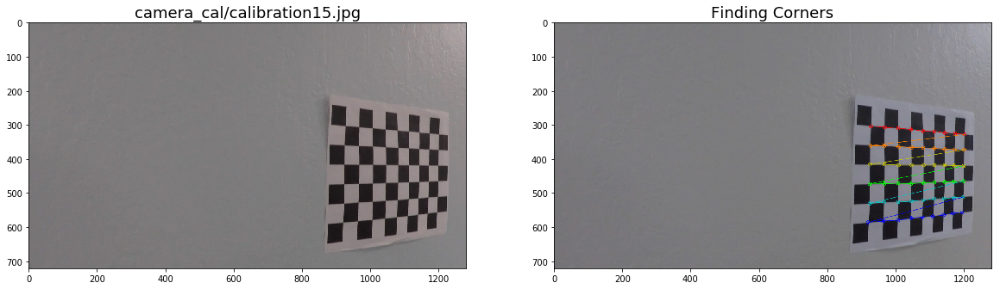

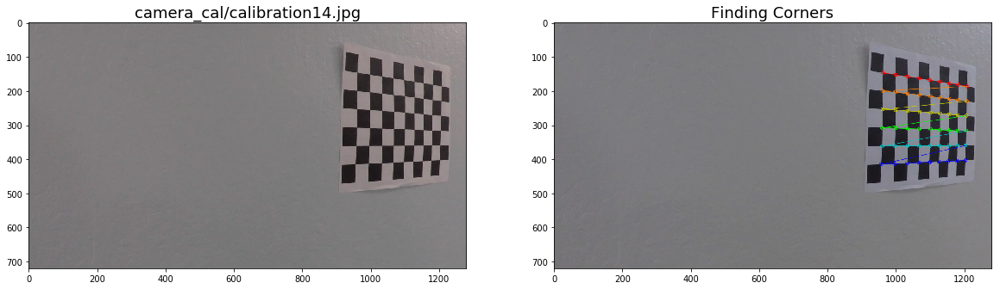

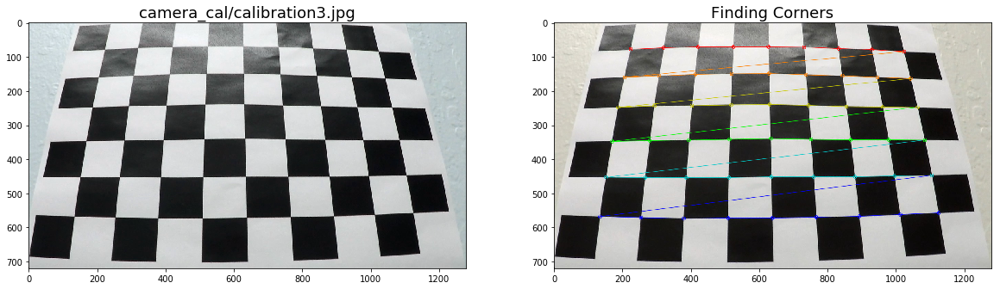

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0)....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step throuth the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title(fname , fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Finding Corners', fontsize=18)

* Distortion Correction

Text(0.5,1,'Undistorted camera_cal')

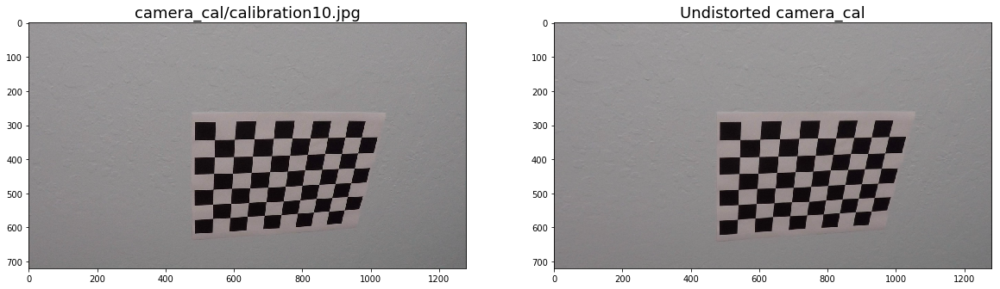

In [3]:
# Undistorting calibration images
img = cv2.imread('camera_cal/calibration10.jpg')
img_size = (img.shape[1], img.shape[0])

# Use cv2.calibrateCamera() and cv2.undistort()
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

f,(ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img)
ax1.set_title('camera_cal/calibration10.jpg', fontsize=18)
ax2.imshow(undist)
ax2.set_title('Undistorted camera_cal', fontsize=18)

## 2. Distortion correction to test images
* Using the calculated camera calibration matrix and distortion coefficient to undistort the test images.

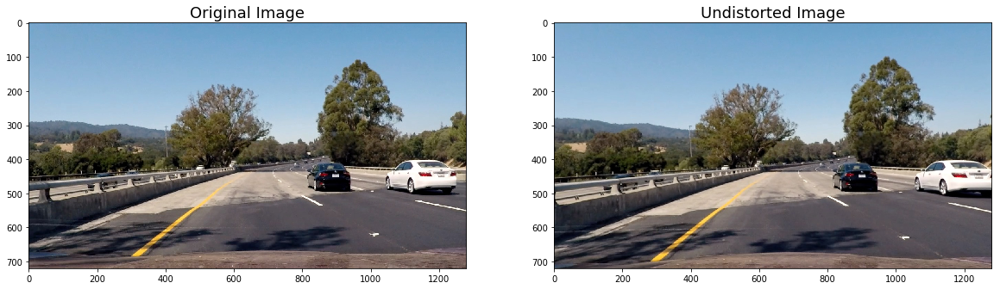

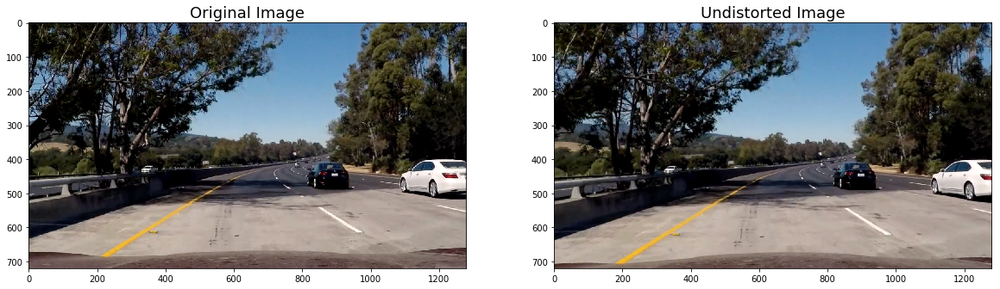

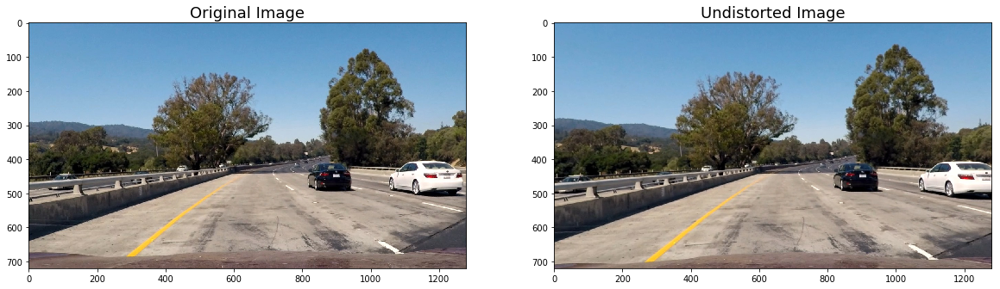

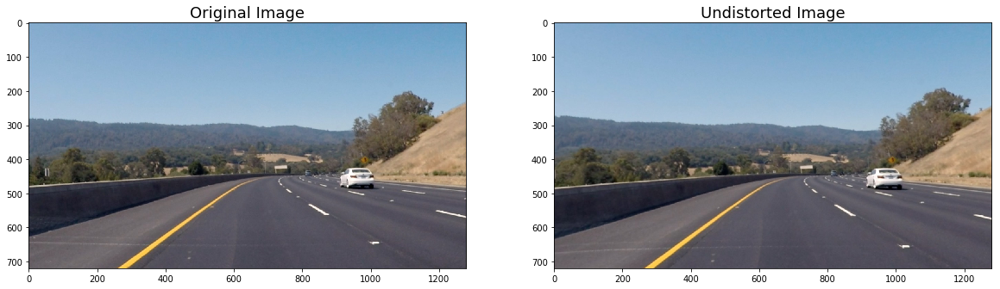

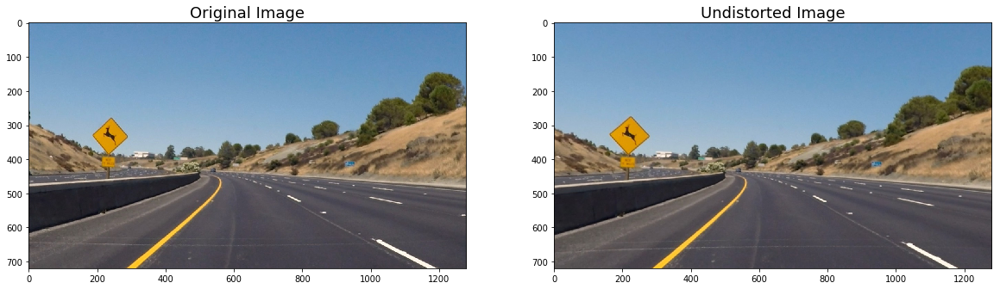

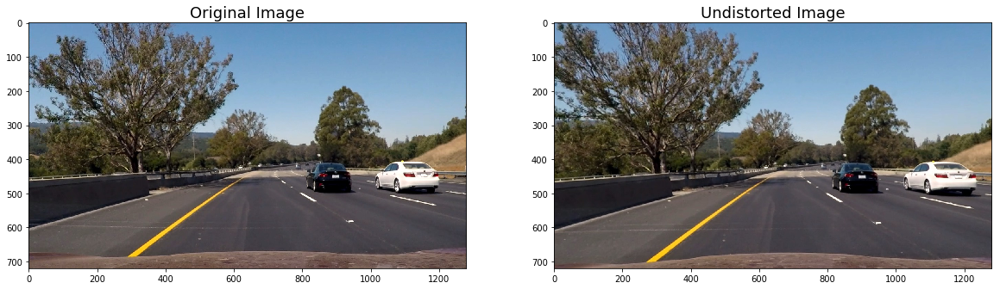

In [4]:
def undistort(img):
    
    img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist
    
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    # undist = cv2.undistort(img, mtx, dist, None, mtx)
    undist = undistort(img)
    # Show original and undistorted images.
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=18)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=18)
    

## 3. Perspective Transform
* Caculate perspective transform coefficient

In [5]:
# Define src and dst points

src = np.float32([[570, 470],[722, 470],
                  [1110, 720],[220, 720]])
dst = np.float32([[320, 1], [920, 1], 
                  [920, 720],[320, 720]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)


* Using caculated perspective transform coefficient to unwarp the test images.

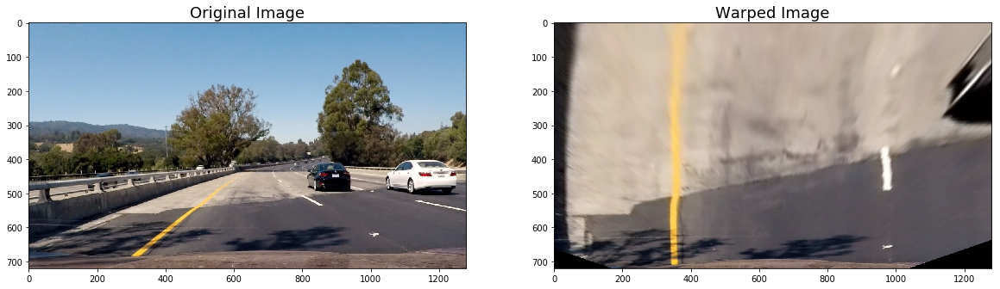

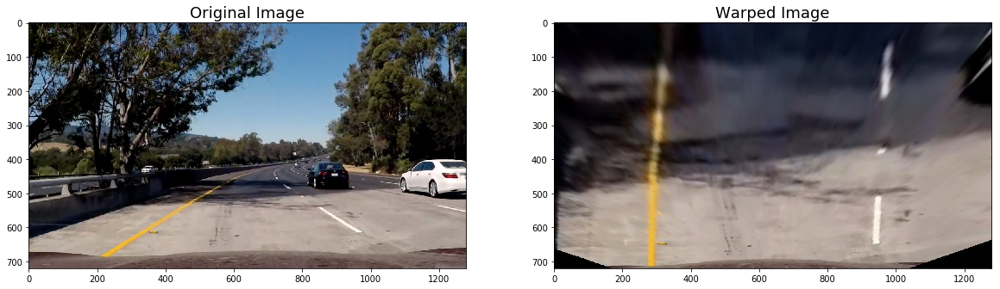

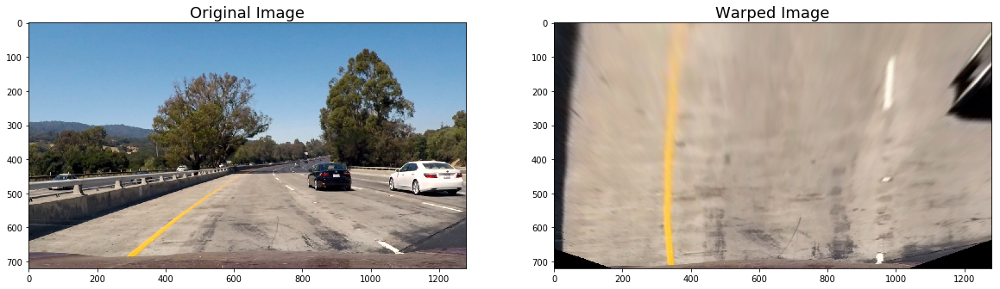

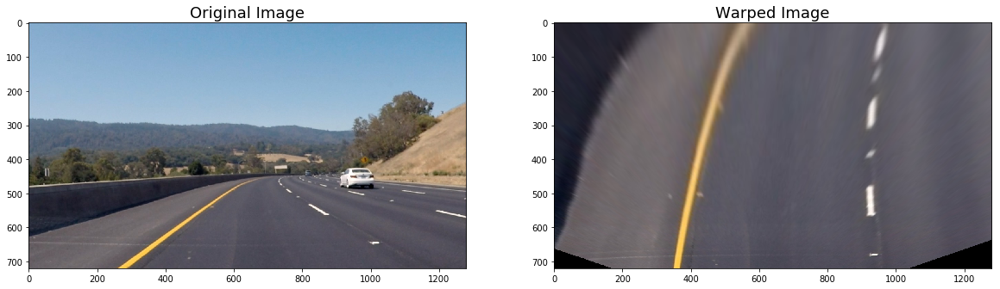

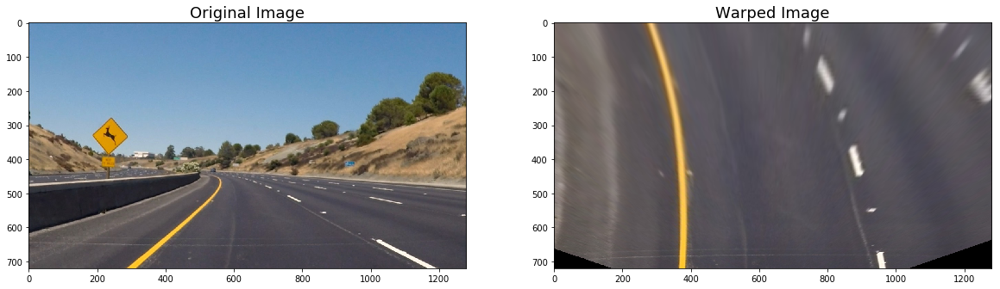

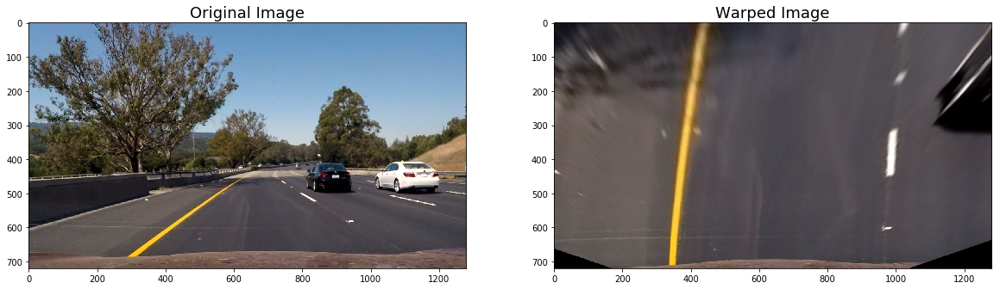

In [6]:
# Define the function of perspective transform
def bird_eye(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR) 
    return warped
    
images = glob.glob('test_images/test*.jpg')

for image in images:
    img = cv2.imread(image)
    warped = bird_eye(img)
    
    # Show original and warped images.
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=18)
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Warped Image', fontsize=18)
    


## 4. Creat thresholded binary image.
### Convert the warped or original images to different color space and creat binary thresholded images, which show the lane lines clearly.
* Absolute, magnitude and direction thresholded binary images.

In [7]:
# Define x direction absolute sobel threshold.
def absx_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size) 
    
    sobel_kernel=3
    absx_thresh=(20, 100)
   
    # Convert to grayscale
    gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    # Take the derivative in x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
        
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobelx = np.uint8(255*sobelx/ np.max(sobelx))

    # Create a binary mask where mag thresholds are met
    binary_outputx = np.zeros_like(scaled_sobelx)
    binary_outputx[(scaled_sobelx >= absx_thresh[0]) & (scaled_sobelx <= absx_thresh[1])] = 1
    
    return binary_outputx


# Define binary magnitude threshold.
def mag_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size) 
    
    sobel_kernel=3
    mag_thresh=(20, 100)
   
    # Convert to grayscale
    gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    gradmag = np.uint8(255*mag/np.max(mag))
    # Create a binary mask where mag thresholds are met
    binary_output_mag = np.zeros_like(gradmag)
    # Return this mask as your binary_output image
    binary_output_mag[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output_mag


# Define binary direction threshold.    
def dir_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size) 
    
    
    sobel_kernel=15
    dir_thresh=(0.7, 1.0)
    
    # Convert to grayscale
    gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    grad_direction = np.arctan2(abs_sobely, abs_sobelx)
    # Create a binary mask where direction thresholds are met
    binary_output_dir = np.zeros_like(grad_direction)
    binary_output_dir[(grad_direction >= dir_thresh[0]) & (grad_direction <= dir_thresh[1])] = 1
    # Return this mask as your binary_output image
    binary_output_dir = np.copy(binary_output_dir) # Remove this line
        
    return binary_output_dir

def gradient_threshold(img):
    
    absx = absx_threshold(img)
    mag = mag_threshold(img)
    dire = dir_threshold(img)
    combined = np.zeros_like(absx)
    # Combine the thresholds of x_sobel, magnitude and direction.
    combined[(absx == 1) | ((mag == 1) & (dire == 1))] = 1
    
    return combined

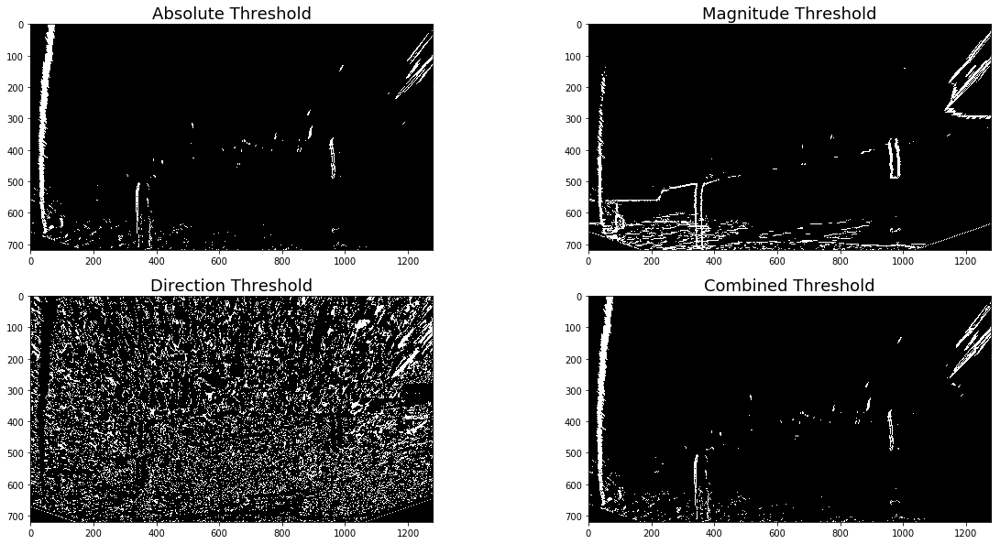

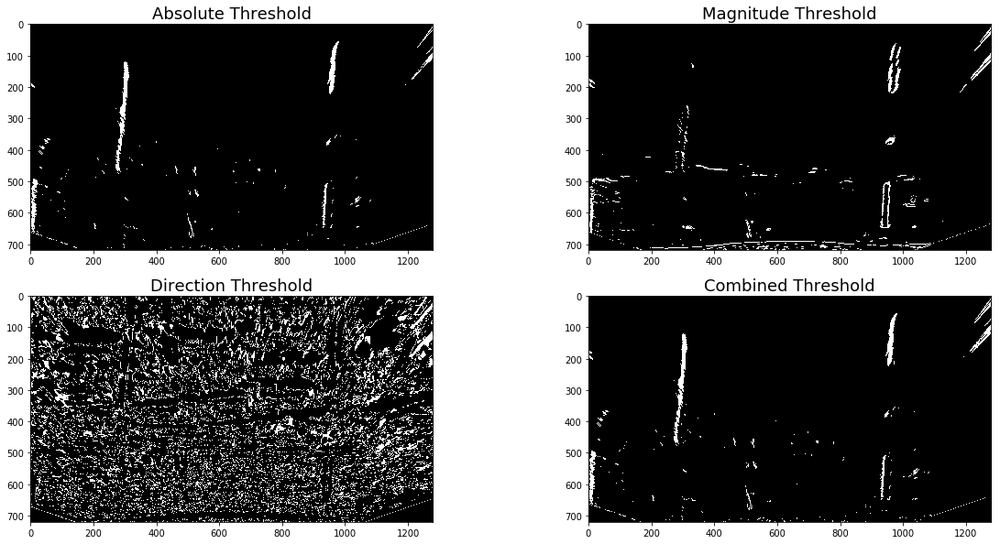

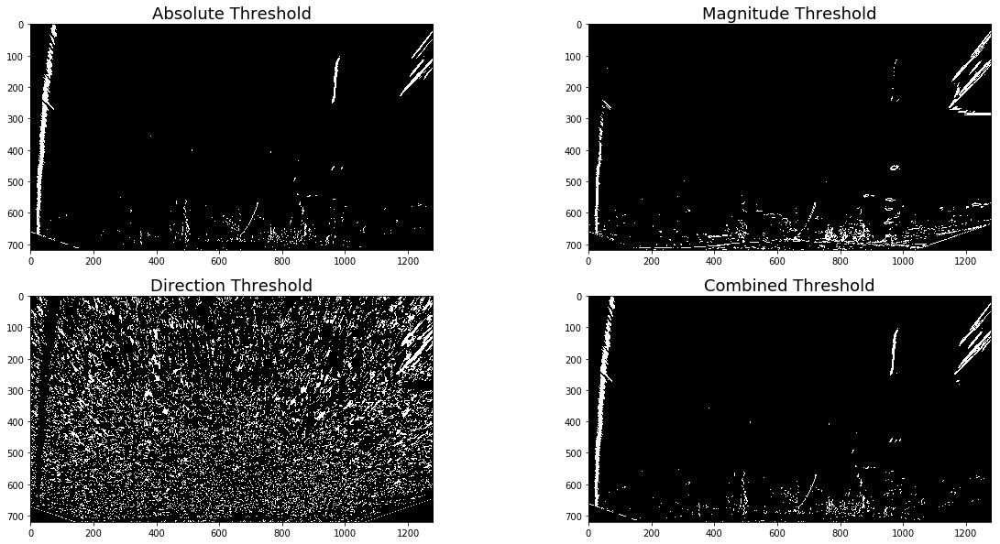

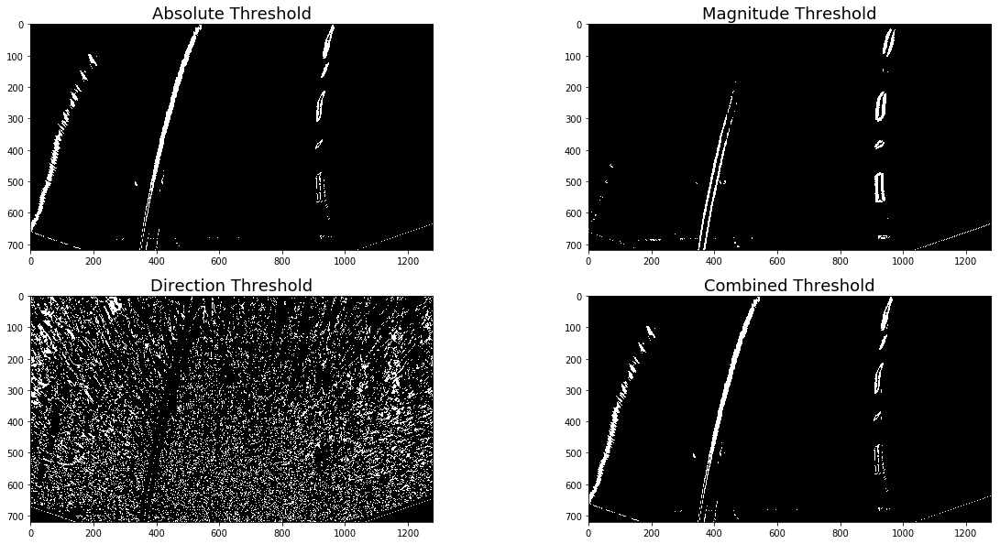

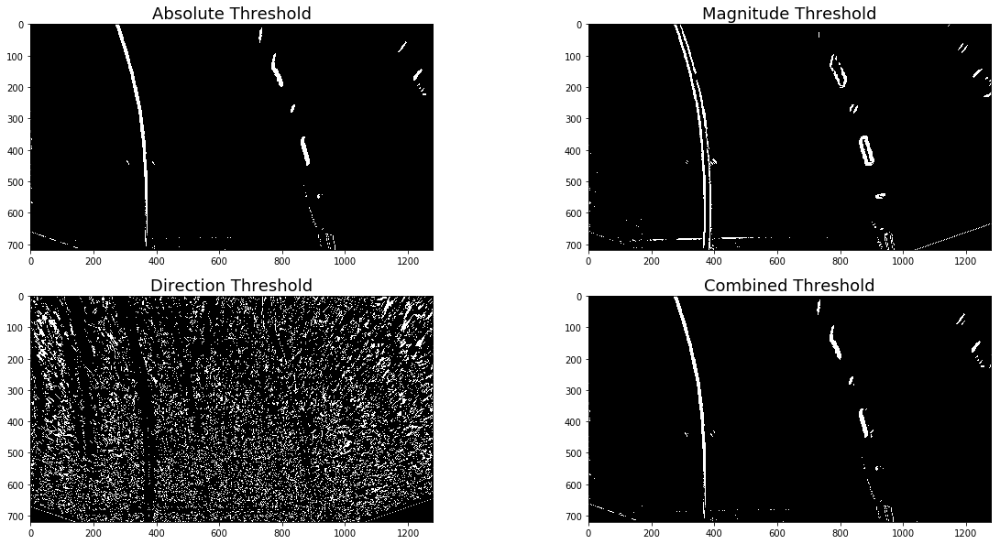

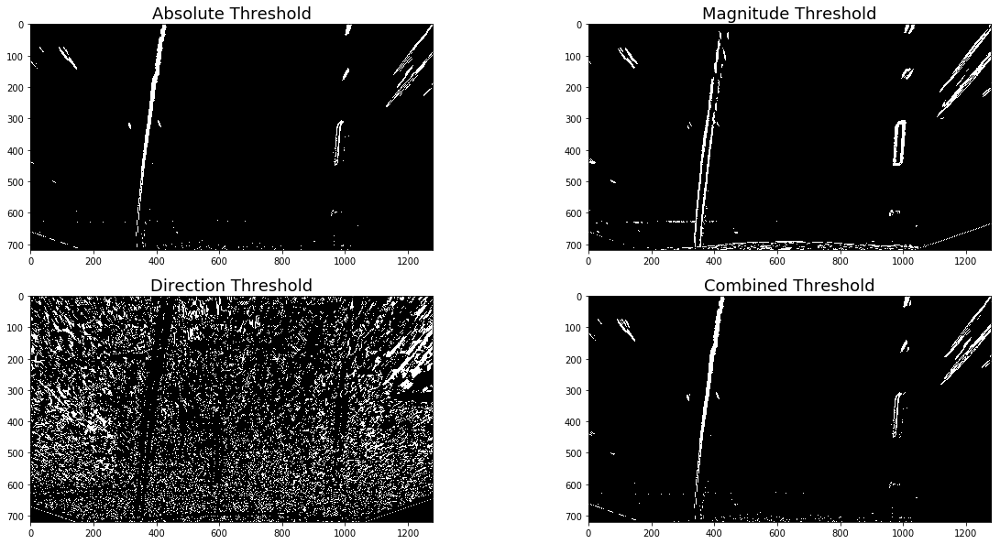

In [8]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 10))
    # Compare the absolute threshold, magnitude threshold, direction threshold and combined threshold.
    ax1.imshow(absx_threshold(img), cmap='gray')
    ax1.set_title('Absolute Threshold', fontsize=18)
    ax2.imshow(mag_threshold(img), cmap='gray')
    ax2.set_title('Magnitude Threshold', fontsize=18)
    ax3.imshow(dir_threshold(img), cmap='gray')
    ax3.set_title('Direction Threshold', fontsize=18)
    ax4.imshow(gradient_threshold(img), cmap='gray')
    ax4.set_title('Combined Threshold', fontsize=18)
   

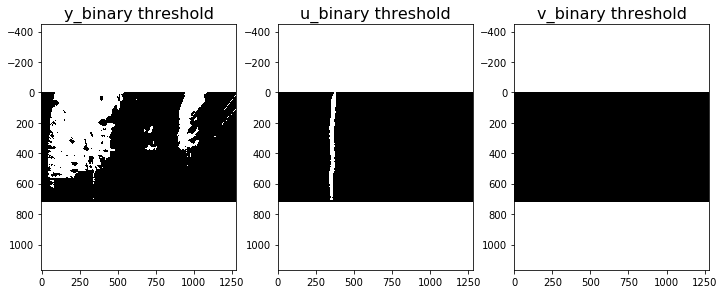

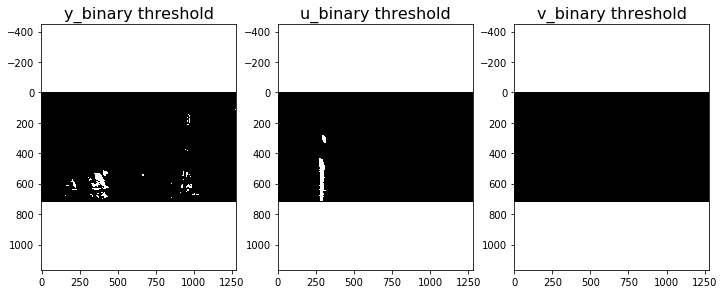

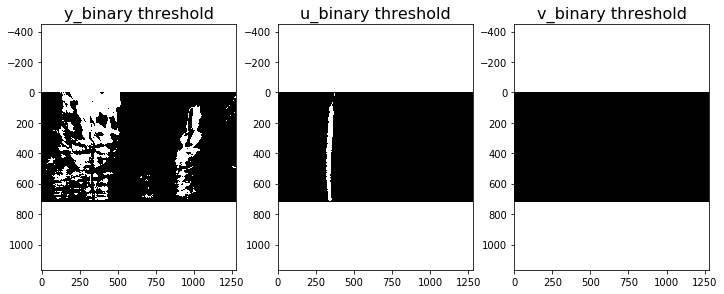

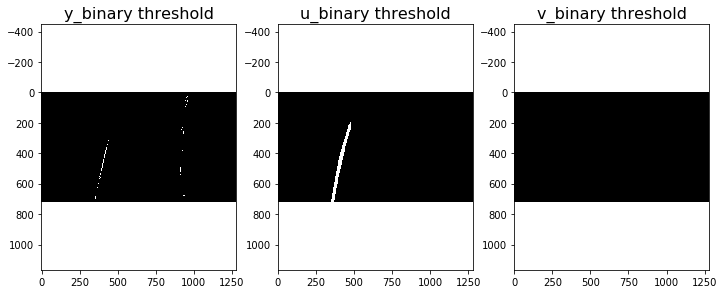

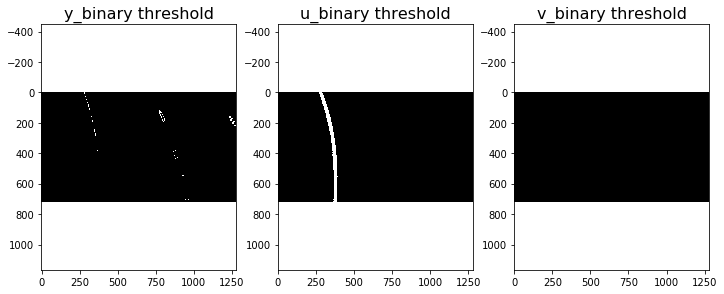

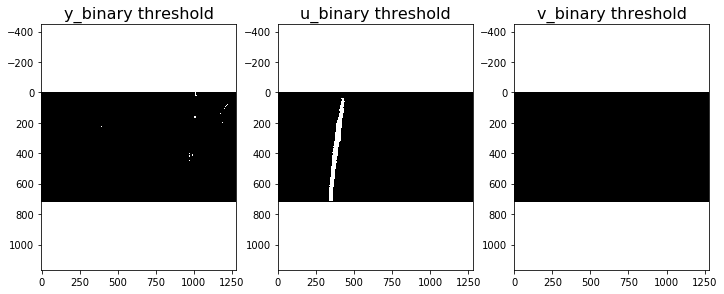

In [9]:
# Text of YUV color space
images = glob.glob('test_images/test*.jpg')

def y_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    yuv = cv2.cvtColor(warped, cv2.COLOR_BGR2YUV)

    y_channel = yuv[:,:,0]
    
    y_thresh = (180, 200)
    y_binary = np.zeros_like(y_channel)
    y_binary[(y_channel >= y_thresh[0]) & (y_channel <= y_thresh[1])] = 1
    return y_binary

def u_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    yuv = cv2.cvtColor(warped, cv2.COLOR_BGR2YUV)
    
    u_channel = yuv[:,:,1]
    u_thresh = (150, 220)
    u_binary = np.zeros_like(u_channel)
    u_binary[(u_channel >= u_thresh[0]) & (u_channel <= u_thresh[1])] = 1
    
    return u_binary

def v_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    yuv = cv2.cvtColor(warped, cv2.COLOR_BGR2YUV)
    v_channel = yuv[:,:,2]
    
    v_thresh = (0, 200)
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= v_thresh[0]) & (v_channel <= v_thresh[1])] = 1
    return v_binary

for image in images:
    
    img = mpimg.imread(image)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Show the original and warped images, and the result of different types of threshold.
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey='col', sharex='row', figsize=(10,4))
    f.tight_layout()

    
    ax1.imshow(y_threshold(img), cmap='gray') 
    ax1.set_title('y_binary threshold', fontsize=16)
    
    ax2.imshow(u_threshold(img), cmap='gray') 
    ax2.set_title('u_binary threshold', fontsize=16)
    
    ax3.imshow(v_threshold(img), cmap='gray') 
    ax3.set_title('v_binary threshold', fontsize=16)
    

* Color thresholded binary images.

In [10]:
# Create binary thresholded images to isolate lane line pixels
def l_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size) 
    
    hls = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    
    l_thresh = (210, 255)
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    return l_binary
    
def s_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    hls = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    
    s_thresh = (100, 255)
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    return s_binary

def b_threshold(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    lab = cv2.cvtColor(warped, cv2.COLOR_BGR2Lab)
    b_channel = lab[:,:,2]
    
    b_thresh = (0, 200)
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh[0]) & (b_channel <= b_thresh[1])] = 1
    return b_binary


def color_thresholds(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    
    l_thresh = (210, 255)
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    s_thresh = (180, 255)
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    lab = cv2.cvtColor(warped, cv2.COLOR_BGR2Lab)
    b_channel = lab[:,:,2]
    
    b_thresh = (150, 200)
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh[0]) & (b_channel <= b_thresh[1])] = 1
    

# test yuv
    yuv = cv2.cvtColor(warped, cv2.COLOR_BGR2YUV)
    
    u_channel = yuv[:,:,1]
    
    u_thresh = (150, 220)
    u_binary = np.zeros_like(u_channel)
    u_binary[(u_channel >= u_thresh[0]) & (u_channel <= u_thresh[1])] = 1
    # Use combination of binary of l, s and b channel.
    combined_binary = np.zeros_like(u_channel)
    combined_binary[(l_binary == 1) | (u_binary == 1) | (b_binary ==1)] = 1
    # Combination of l and b channel has less noise.
    
    
# test gradient
    absx = absx_threshold(img)
    mag = mag_threshold(img)
    dire = dir_threshold(img)
    #combineded = np.zeros_like(absx)
    # Combine the thresholds of x_sobel, magnitude and direction.
    #combineded[(absx == 1) | ((mag == 1) & (dire == 1))] = 1
    
    #combined_binary = np.zeros_like(s_channel)
    #combined_binary[(l_binary == 1) | (s_binary ==1)] = 1
    #combined_binary[(l_binary == 1) | (s_binary ==1) | (combineded == 1)] = 1
       
    return combined_binary

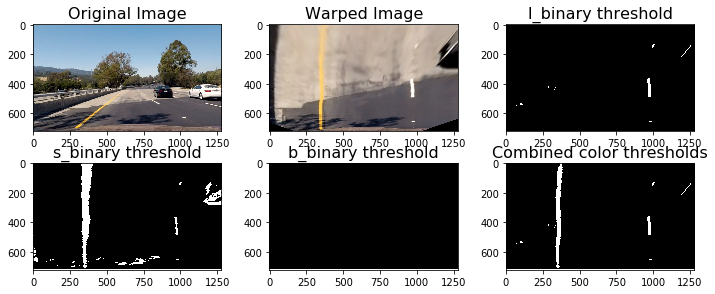

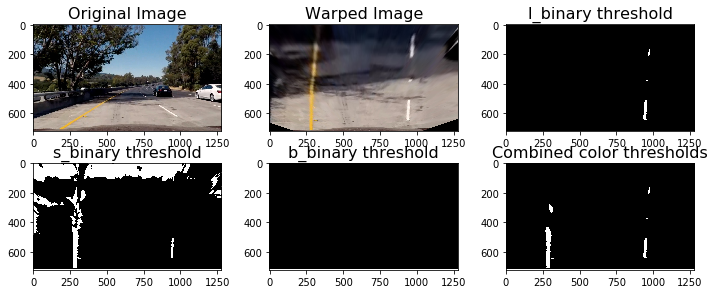

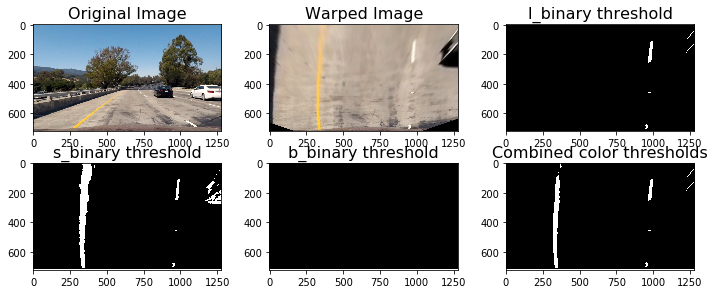

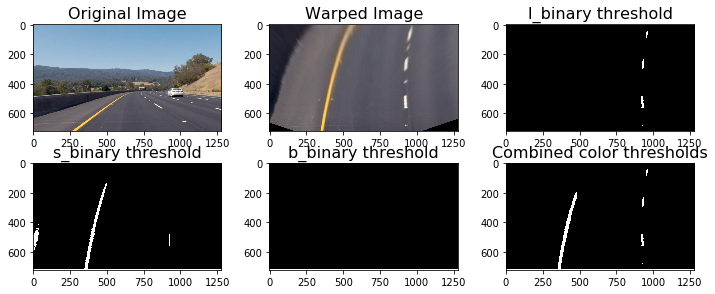

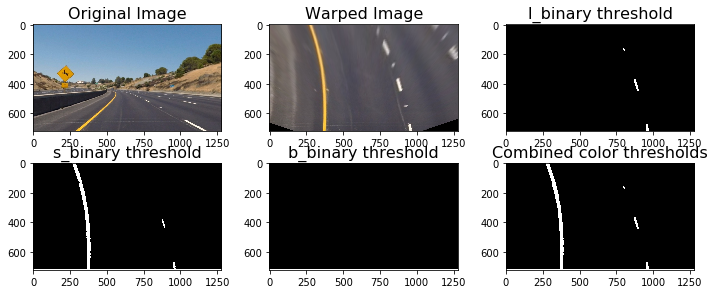

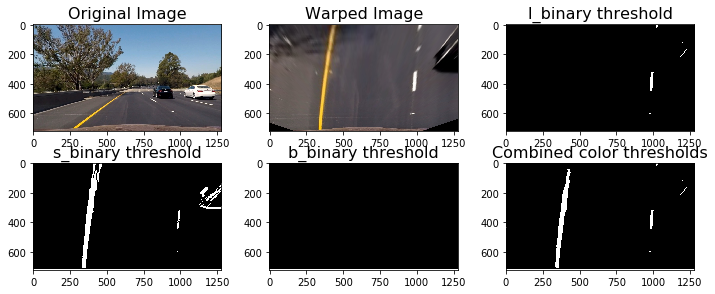

In [11]:

for image in images:
    
    img = mpimg.imread(image)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Show the original and warped images, and the result of different types of threshold.
    f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
    f.tight_layout()

    
    ax1.imshow(undist)    
    ax1.set_title('Original Image', fontsize=16)
    
    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=16)
    
    ax3.imshow(l_threshold(img), cmap='gray') 
    ax3.set_title('l_binary threshold', fontsize=16)
    
    ax4.imshow(s_threshold(img), cmap='gray') 
    ax4.set_title('s_binary threshold', fontsize=16)
    
    ax5.imshow(b_threshold(img), cmap='gray')
    #ax5.imshow(u_threshold(img))
    ax5.set_title('b_binary threshold', fontsize=16)
    
    ax6.imshow(color_thresholds(img), cmap='gray')
    ax6.set_title('Combined color thresholds', fontsize=16)

## 5.  Find the lane lines boundry and measure curvature.
### Find the lines with histogram peaks and sliding windows ployfit, and with continuous curved window ployfit. 
* Histogram peaks

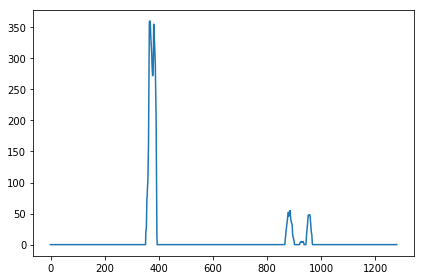

In [12]:
# img = color_thresholds('test_images/test1.jpg')
def hist(image):
    
    img = color_thresholds(image)
    #img = u_threshold(image)
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0] // 2:,:]
    
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    # plt.plot(histogram)
    
    return histogram


images = glob.glob('test_images/test2.jpg')
for image in images:
    
    img = cv2.imread(image)
    histogram = hist(img)
    plt.plot(histogram)
    plt.tight_layout()

* Sliding window polyfit

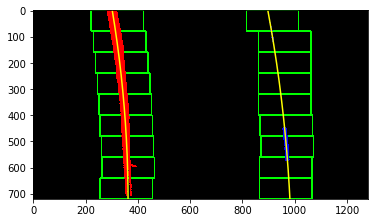

In [13]:
def find_lane_pixels(binary_warped):
    
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    #qutpoint = np.int(midpoint//2)
    #leftx_base = np.argmax(histogram[qutpoint:midpoint])
    #rightx_base = np.argmax(histogram[midpoint:(midpoint+qutpoint)]) + midpoint
    
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #leftx_base = np.argmax(histogram[150:midpoint])
    #rightx_base = np.argmax(histogram[midpoint:1100]) + midpoint
    # Test
    #leftx_base = np.argmax(histogram[(0.1*midpoint):midpoint])
    #rightx_base = np.argmax(histogram[midpoint:(1.5*midpoint)]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 3) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fitx, right_fitx
images = glob.glob('test_images/shortcut1.jpg')
for image in images:
    img = cv2.imread(image)
    img1 = color_thresholds(img)
    out_img, left_fitx, right_fitx = fit_polynomial(img1)
    plt.imshow(out_img)

* Polyfit using fit from previous frame

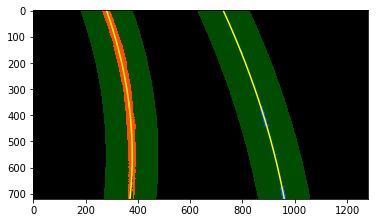

In [14]:
def search_around_ploy(image):
    #img = color_thresholds(image)
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(image)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    
    margin = 100
    
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array([1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +
                     right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                     right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((image, image, image))*225
    window_img = np.zeros_like(out_img)
    

    
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),(0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]),(0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result, left_fitx, right_fitx

images = glob.glob('test_images/test2.jpg')
for image in images:
    img = cv2.imread(image)
    img1 = color_thresholds(img)
    result, left_fitx, right_fitx = search_around_ploy(img1)
    plt.imshow(result)

## 6. Curvature of the lane lines and vehicle position with respect to center.

In [15]:
# Measure radius of curbature for each lane line.

def curvature_radius(image):
    # input the values of previous steps
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(image)
    
    #leftx = leftx[::-1]
    #rightx = rightx[::-1]
    
    #img = color_thresholds(image)
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    y_eval = np.max(ploty)
    
    # meters per pixel
    ym_per_pixel = 30 / 720
    xm_per_pixel = 3.7 / 700
    
    # print(ploty * ym_per_pixel, leftx * xm_per_pixel)
    
    # Fit new polynomials
    #left_fit_cr = np.polyfit(ploty * ym_per_pixel, leftx * xm_per_pixel, 2)
    #right_fit_cr = np.polyfit(ploty * ym_per_pixel, rightx * xm_per_pixel, 2)
    
    left_fit_cr = np.polyfit(lefty * ym_per_pixel, leftx * xm_per_pixel, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pixel, rightx * xm_per_pixel, 2)
    #print(left_fit_cr, right_fit_cr)
    
    left_curvature_radius = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pixel + 
                            left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature_radius = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pixel + 
                            right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    average_curvature_radius = (left_curvature_radius + right_curvature_radius) / 2
    
    str = 'Curvature radius is %.2f meter.'% (average_curvature_radius)
    #print(average_curvature_radius)
    return str

#img = color_thresholds('test_images/test2.jpg')

#print(curvature_radius(img))
images = glob.glob('test_images/test2.jpg')
for image in images:
    img = cv2.imread(image)
    img1 = color_thresholds(img)
    print(curvature_radius(img1))

Curvature radius is 696.21 meter.


* compute the offset of lane line center

In [16]:
def offset(image):
    
    # input the values of previous steps
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(image)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    #img = color_thresholds(image)
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
     
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    lane_center = (left_fitx[0] + right_fitx[0]) / 2
    #print(lane_center)
    
    xm_per_pixel = 3.7/700
    offset_pixel = image.shape[1]/2 - lane_center 
    
    offset_meter = xm_per_pixel * offset_pixel
    absolute = abs(offset_meter)
    if offset_meter <= 0:
        str = 'Vehicle is %.2f meter left of the lane center.'% (absolute) 
    else:
        str = 'Vehicle is %.2f meter right of the lane center.'% (absolute)
    return str
        
images = glob.glob('test_images/test3.jpg')
for image in images:
    img = cv2.imread(image)
    img1 = color_thresholds(img)
    print(offset(img1))

Vehicle is 0.60 meter left of the lane center.


## 7. Inverse transformation

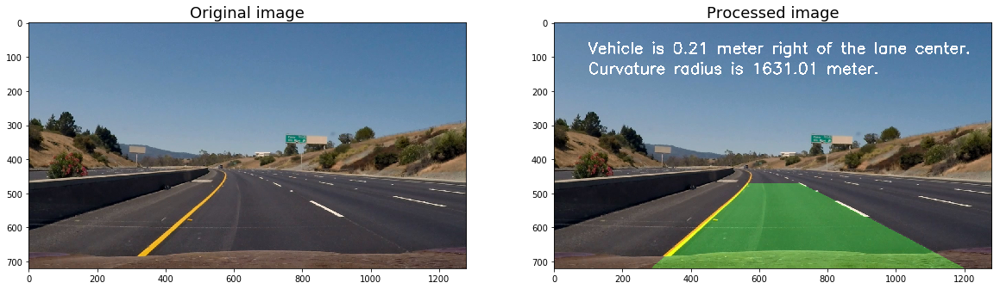

In [17]:
# Define the pipline of all the image processes
def pipline(image):
    
    # Using the color thresholds image to find the green covered lane line area.
    warped = color_thresholds(image) # color thresholded image
   
    warped_zero = np.zeros_like(warped).astype(np.uint8)
    
    thresholded = np.dstack((warped_zero, warped_zero, warped_zero))*255
    # step2
    #f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
    #ax1.imshow(thresholded, cmap = "gray")
    
    # step3
    #f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
    #ax1.imshow(img, cmap = "gray")
    img_size = (image.shape[1], image.shape[0])
    
    # input the values of previous steps
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped)
  
    
    # try to use the value of ployfit
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, 719, 720)
    
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # left line by warped thresholded image
    left_line = np.array(np.transpose(np.vstack([left_fitx, ploty])))
    # right line by warped thresholded image
    right_line = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
    
    lines = np.vstack((left_line, right_line))
    
    cv2.fillPoly(thresholded, np.int_([lines]), [0,255, 0])
    
   
    #f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
    #ax1.imshow(cv2.fillPoly(thresholded, np.int_([lines]), [0,255, 0]))
    
    unwarped = cv2.warpPerspective(thresholded, Minv, img_size , flags=cv2.INTER_LINEAR)
    
    result = cv2.addWeighted(image, 1, unwarped, 0.3, 0)
    #resulted = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    
    distance = offset(warped)
    radius = curvature_radius(warped)
    cv2.putText(result, distance , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3)
    cv2.putText(result, radius, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3)
    
    return result
    
images = glob.glob('test_images/shortcut1.jpg')  
#plt.imshow(inverse_bird_eye('test_images/test2.jpg'))

for image in images:
    img = mpimg.imread(image)
    inversed = pipline(img)
    
    
    
    #cv2.putText(inversed, distance , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3)
    #cv2.putText(inversed, radius, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3)
    
    f,(ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(img)
    ax1.set_title('Original image', fontsize=18)
    # ax2.imshow(cv2.cvtColor(inversed, cv2.COLOR_BGR2RGB))
    ax2.imshow(inversed)
    #ax2.text(200, 100, radius, style='italic', color='white', frontsize=10)
    #ax2.text(200, 175,)
    ax2.set_title('Processed image', fontsize=18)
    

## 8. Input video in image treat process pipline.

In [18]:
### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# Set up lines for left and right
#left_lane = Line()
#right_lane = Line()
output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipline) 
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [14:23<00:00,  1.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 11min 30s, sys: 37.1 s, total: 12min 7s
Wall time: 14min 26s


## Try to process the Challenge Video.

In [19]:
output = 'harder_challenge_video_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(pipline) 
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


 49%|████▉     | 589/1200 [07:23<06:54,  1.48it/s]

TypeError: expected non-empty vector for x